# Railway Track Fault Detection
---
|Subject:|Mathematical Modeling Practice|
|---|---|
|Semester:|Fall 2022|
|Name:|Tamás Demus|
|NEPTUN:|XP4B9D|
---

## Dataset
---
|Name:|Railway Track Fault Detection|
|---|---|
|Link to dataset:|https://www.kaggle.com/datasets/salmaneunus/railway-track-fault-detection|
---

Importing modules

In [153]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns

import cv2 as cv

from sklearn.metrics import ConfusionMatrixDisplay, RocCurveDisplay

import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

from tqdm import trange, tqdm
import os

Setting up environment

In [2]:
raw_folder = './raw/'
data_folder = './data/'
preprocessed_folder = './preprocessed/'

PATH = [
    'Train/Non defective/',
    'Train/Defective/',
    'Validation/Non defective/',
    'Validation/Defective/',
    'Test/Non defective/',
    'Test/Defective/',
]

RAW_PATH = [os.path.join(raw_folder, p) for p in PATH]
DATA_PATH = [os.path.join(data_folder, p) for p in PATH]
PREPROCESSED_PATH = [os.path.join(preprocessed_folder, p) for p in PATH]

for p in PREPROCESSED_PATH:
    if not os.path.exists(p):
        os.makedirs(p)
        
for p in DATA_PATH:
    if not os.path.exists(p):
        os.makedirs(p)

Check file types

In [3]:
ext = []

for p in RAW_PATH:
    for f in os.listdir(p):
        ext.append(os.path.splitext(f)[-1])
    
print(set(ext))

{'.jpeg', '.jpg', '.webp'}


Copying raw dataset with new filenames and converting the extensions

In [4]:
i = 0
p_new = 0
for p in RAW_PATH:
    for f in tqdm(os.listdir(p), desc=p):
        dst = os.path.join(DATA_PATH[p_new], str(i)+'.jpg')
        if not os.path.exists(dst):
            src = os.path.join(p, f)
            img = cv.imread(src)
            cv.imwrite(dst, img)
        i += 1
    p_new += 1


./raw/Test/Defective/: 100%|██████████| 11/11 [00:00<00:00, 17247.61it/s]


Creating image dataframe

In [5]:
images = pd.DataFrame({
    'type': pd.Series(dtype='str'),
    'defect': pd.Series(dtype='int'),
    'defect_str': pd.Series(dtype='str'),
    'path': pd.Series(dtype='str'),
    'filename': pd.Series(dtype='str'),
    'img': pd.Series(dtype='str'),
    'width': pd.Series(dtype='int'),
    'height': pd.Series(dtype='int'),
    'components': pd.Series(dtype='int'),
    'R_mean': pd.Series(dtype='float'),
    'G_mean': pd.Series(dtype='float'),
    'B_mean': pd.Series(dtype='float')
})

for each in DATA_PATH:
    p = each.split('/')
    t = p[2].lower()
    if p[3] == 'Defective':
        y = 1
    else:
        y = 0
    for img in os.listdir(each):
        d = {
            'type': t,
            'defect': y,
            'defect_str': p[3],
            'path': each,
            'filename': img,
            'img': os.path.join(each, img),
            'width': 0,
            'height': 0,
            'components': 0,
            'R_mean': 0,
            'G_mean': 0,
            'B_mean': 0
        }
        df = pd.DataFrame(data=d, index=[1])
        images = pd.concat([images, df])

images.reset_index(inplace=True, drop=True)
display(images)
images.info()

,type,defect,defect_str,path,filename,img,width,height,components,R_mean,G_mean,B_mean
0,train,0,Non defective,./data/Train/Non defective/,97.jpg,./data/Train/Non defective/97.jpg,0,0,0,0.0,0.0,0.0
1,train,0,Non defective,./data/Train/Non defective/,79.jpg,./data/Train/Non defective/79.jpg,0,0,0,0.0,0.0,0.0
2,train,0,Non defective,./data/Train/Non defective/,114.jpg,./data/Train/Non defective/114.jpg,0,0,0,0.0,0.0,0.0
3,train,0,Non defective,./data/Train/Non defective/,18.jpg,./data/Train/Non defective/18.jpg,0,0,0,0.0,0.0,0.0
4,train,0,Non defective,./data/Train/Non defective/,46.jpg,./data/Train/Non defective/46.jpg,0,0,0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
379,test,1,Defective,./data/Test/Defective/,381.jpg,./data/Test/Defective/381.jpg,0,0,0,0.0,0.0,0.0
380,test,1,Defective,./data/Test/Defective/,379.jpg,./data/Test/Defective/379.jpg,0,0,0,0.0,0.0,0.0
381,test,1,Defective,./data/Test/Defective/,377.jpg,./data/Test/Defective/377.jpg,0,0,0,0.0,0.0,0.0
382,test,1,Defective,./data/Test/Defective/,380.jpg,./data/Test/Defective/380.jpg,0,0,0,0.0,0.0,0.0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 384 entries, 0 to 383
Data columns (total 12 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   type        384 non-null    object 
 1   defect      384 non-null    int64  
 2   defect_str  384 non-null    object 
 3   path        384 non-null    object 
 4   filename    384 non-null    object 
 5   img         384 non-null    object 
 6   width       384 non-null    int64  
 7   height      384 non-null    int64  
 8   components  384 non-null    int64  
 9   R_mean      384 non-null    float64
 10  G_mean      384 non-null    float64
 11  B_mean      384 non-null    float64
dtypes: float64(3), int64(4), object(5)
memory usage: 36.1+ KB


Extract basic features from the images

In [6]:
width = []
height = []
components = []
R_mean = []
G_mean = []
B_mean = []

for i in tqdm(images.index):
    image = cv.imread(images.iloc[i].img)
    width.append(image.shape[0])
    height.append(image.shape[1])
    components.append(image.shape[2])
    R_mean.append(np.mean(image[:,:,0]))
    G_mean.append(np.mean(image[:,:,1]))
    B_mean.append(np.mean(image[:,:,2]))

images.update({'width': width})
images.update({'height': height})
images.update({'components': components})
images.update({'R_mean': R_mean})
images.update({'G_mean': G_mean})
images.update({'B_mean': B_mean})

100%|██████████| 384/384 [01:22<00:00,  4.66it/s]


Check the shape of the images

Minimum  width  :  148  @  243
Maximum  width  :  8000  @  241
Minimum  height  :  156  @  297
Maximum  height  :  8000  @  152
Minimum  components  :  3  @  0
Maximum  components  :  3  @  0
Minimum sizes:
width     148
height    194
Name: 243, dtype: int64
width     322
height    156
Name: 297, dtype: int64


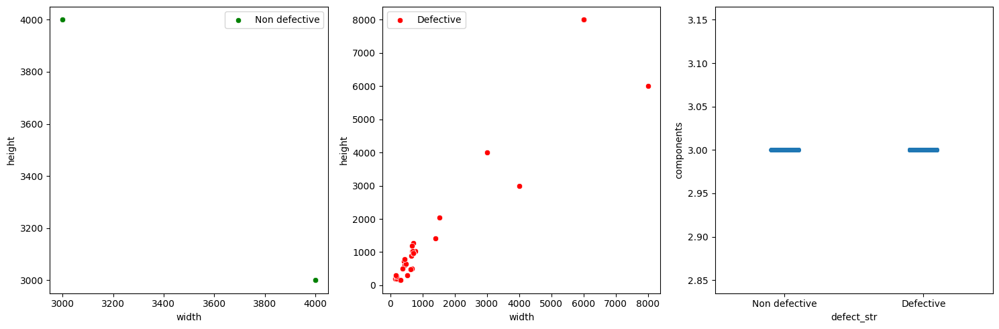

In [12]:
dims = ['width', 'height', 'components']
for dim in dims:
    print('Minimum ', dim, ' : ', images[dim].min(), ' @ ', images[dim].argmin())
    print('Maximum ', dim, ' : ', images[dim].max(), ' @ ', images[dim].argmax())

min_width = np.argmin(images.width)
min_height = np.argmin(images.height)
print('Minimum sizes:')
print(images[['width', 'height']].iloc[min_width])
print(images[['width', 'height']].iloc[min_height])

fig, ax = plt.subplots(1, 3, figsize=(15, 5), tight_layout=True)
sns.scatterplot(x='width', y='height', data=images[images.defect == 0], ax=ax[0], label='Non defective', color='green')
sns.scatterplot(x='width', y='height', data=images[images.defect == 1], ax=ax[1], label='Defective', color='red')
sns.stripplot(x='defect_str', y='components', data=images, ax=ax[2])
plt.show()

Check main component distribution of the images

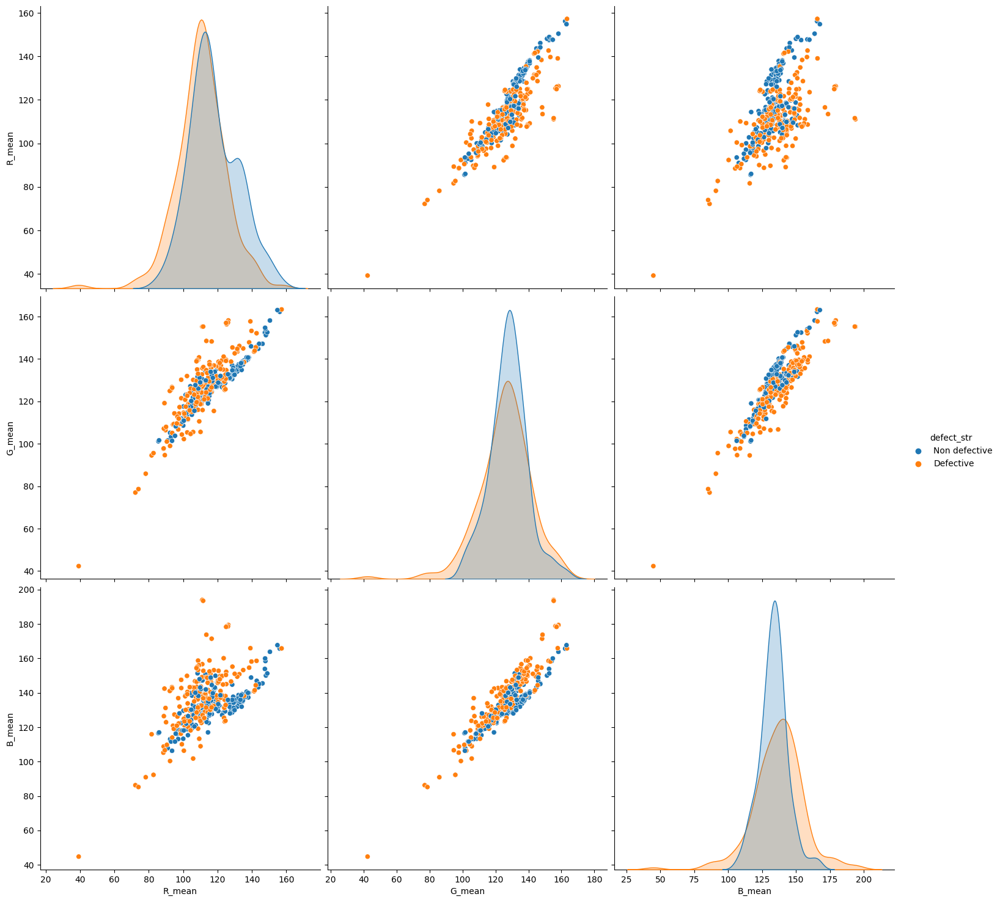

In [13]:
cols = ['R_mean', 'G_mean', 'B_mean']
sns.pairplot(data=images, vars=cols, hue='defect_str', height=5)
plt.show()

Check if dataset is balanced

In [14]:
images.groupby(['type', 'defect_str']).count()

defect  path  filename  img  width  height  \
type       defect_str                                                  
test       Defective          11    11        11   11     11      11   
           Non defective      11    11        11   11     11      11   
train      Defective         150   150       150  150    150     150   
           Non defective     150   150       150  150    150     150   
validation Defective          31    31        31   31     31      31   
           Non defective      31    31        31   31     31      31   

                          components  R_mean  G_mean  B_mean  
type       defect_str                                         
test       Defective              11      11      11      11  
           Non defective          11      11      11      11  
train      Defective             150     150     150     150  
           Non defective         150     150     150     150  
validation Defective              31      31      31      31  
           Non defective          31      31      31      31

Generating random sample from training data

In [17]:
N_samples = 2
random_sample_idx = []
for i in range(N_samples):
    idx = np.random.choice(images[(images.type == 'train') & (images.defect == 0)].index)
    random_sample_idx.append(idx)
for i in range(N_samples, 2*N_samples):
    idx = np.random.choice(images[(images.type == 'train') & (images.defect == 1)].index)
    random_sample_idx.append(idx)
random_sample = images.iloc[random_sample_idx].copy()
random_sample

,type,defect,defect_str,path,filename,img,width,height,components,R_mean,G_mean,B_mean
54,train,0,Non defective,./data/Train/Non defective/,120.jpg,./data/Train/Non defective/120.jpg,3000,4000,3,148.937476,152.594346,151.254820
26,train,0,Non defective,./data/Train/Non defective/,51.jpg,./data/Train/Non defective/51.jpg,3000,4000,3,113.636046,127.031100,135.016769
152,train,1,Defective,./data/Train/Defective/,266.jpg,./data/Train/Defective/266.jpg,6000,8000,3,125.067019,134.717151,145.027696
210,train,1,Defective,./data/Train/Defective/,249.jpg,./data/Train/Defective/249.jpg,4000,3000,3,120.576002,136.574193,146.432578


Visualizing random sample

100%|██████████| 4/4 [00:02<00:00,  1.54it/s]


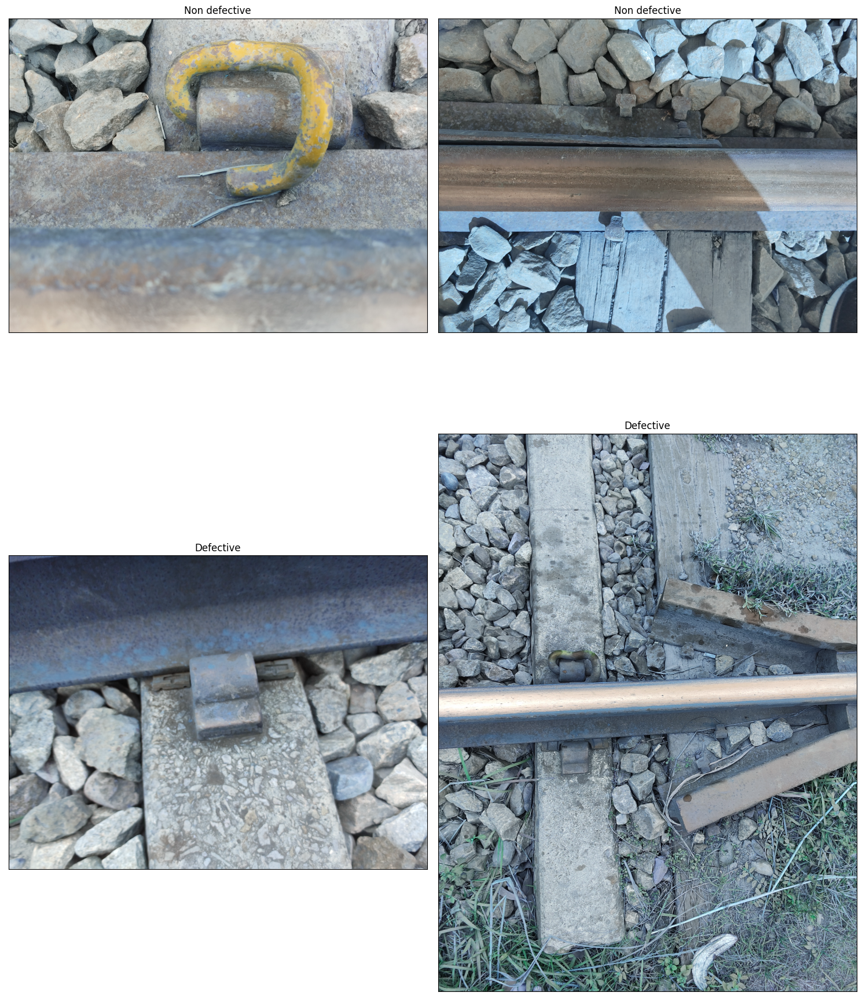

In [18]:
fig, ax = plt.subplots(N_samples, 2, figsize=(15, 10*N_samples), tight_layout=True)
ax = ax.flatten()

for i, idx in enumerate(tqdm(random_sample.index)):
    image = cv.imread(images.img[idx])
    ax[i].imshow(image)
    ax[i].set_xticks(ticks=[])
    ax[i].set_yticks(ticks=[])
    ax[i].set_title(images.defect_str[idx])

plt.show()

Checking basic information on random sample: color components on RGB and HSV

4it [00:15,  3.85s/it]


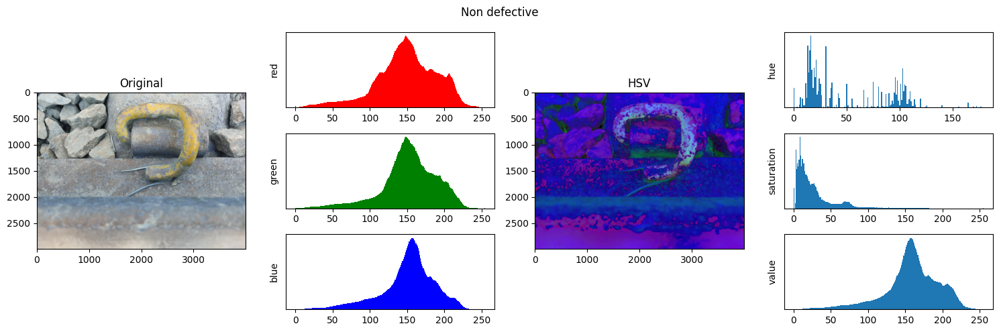

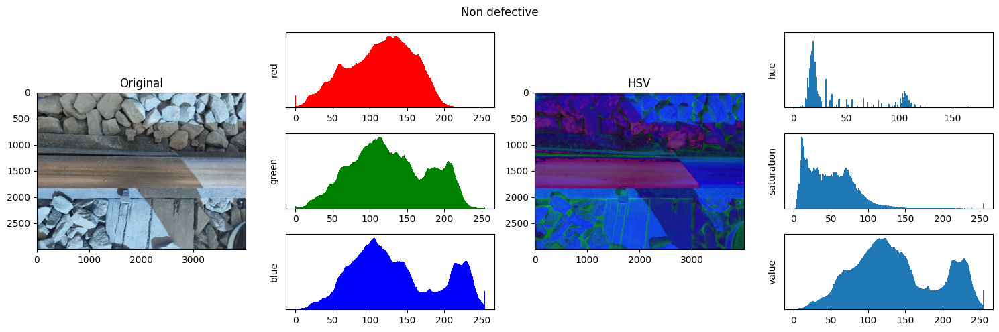

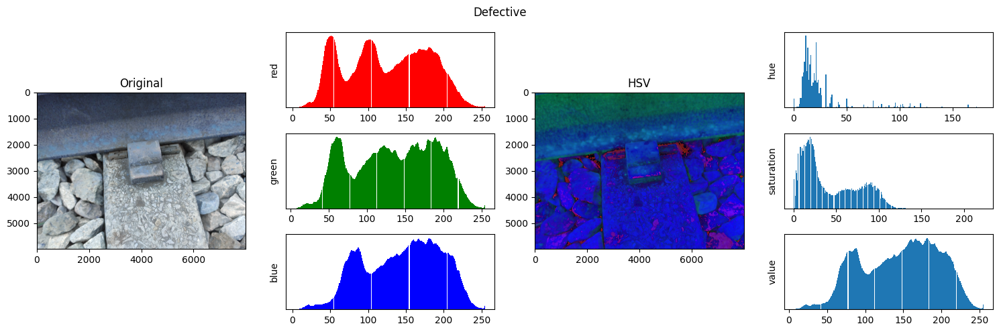

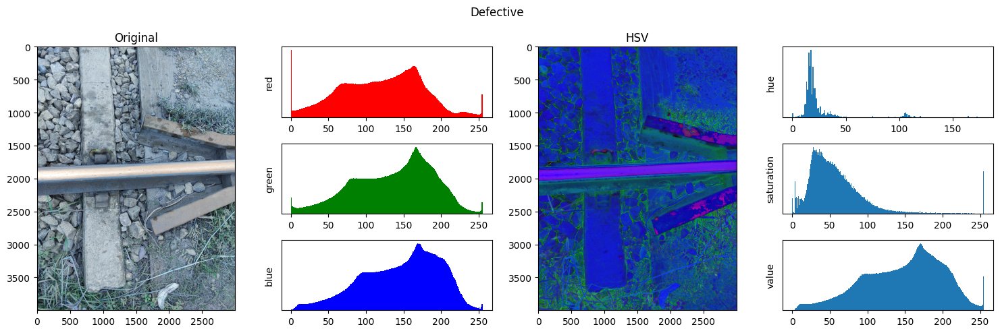

In [19]:
gs = gridspec.GridSpec(3, 4)

for sample in tqdm(random_sample[['img', 'defect_str']].itertuples()):
    fig = plt.figure(figsize=(15, 5), tight_layout=True)
    fig.suptitle(sample.defect_str)
    ax = [
        fig.add_subplot(gs[:, 0]),
        fig.add_subplot(gs[0, 1]),
        fig.add_subplot(gs[1, 1]),
        fig.add_subplot(gs[2, 1]),
        fig.add_subplot(gs[:, 2]),
        fig.add_subplot(gs[0, 3]),
        fig.add_subplot(gs[1, 3]),
        fig.add_subplot(gs[2, 3]),
    ]
    image = cv.imread(sample.img)
    ax[0].imshow(image)
    ax[0].set_title('Original')
    
    for c, component in enumerate(['red', 'green', 'blue']):
        ax[c+1].hist(image[:, :, c].ravel(), bins=256, color=component)
        ax[c+1].set_ylabel(component)
        ax[c+1].set_yticks([])
        
    hsv = cv.cvtColor(image, cv.COLOR_BGR2HSV)
    ax[4].imshow(hsv)
    ax[4].set_title('HSV')
    
    for c, component in enumerate(['hue', 'saturation', 'value']):
        bins = [180, 256, 256]
        ax[c+5].hist(hsv[:, :, c].ravel(), bins=bins[c])
        ax[c+5].set_ylabel(component)
        ax[c+5].set_yticks([])

In [27]:
img = cv.imread(images.iloc[0].img)
img.shape

(3000, 4000, 3)

Edge detection

In [128]:
img_height = 128
img_width = 128

class ImageProcessor:
    
    def __init__(self, sample):
        self.imgs = [cv.imread(sample.img)]
        self.step = ['original']
        self.plot_kwargs = [{}]
        self.lines = []
    
    def resize(self):
        h, w = self.imgs[-1].shape[:2]
        if w < h:
            nh = int(h/w * img_height)
            nw = img_width
            self.imgs.append(
                cv.resize(self.imgs[-1], (nh, nw), interpolation=cv.INTER_AREA)
            )
            pad = int((nh - img_height) / 2)
            if pad > 0:
                self.imgs[-1] = self.imgs[-1][:, pad:-pad]
        else:
            nh = img_height
            nw = int(w/h * img_width)
            self.imgs.append(
                cv.resize(self.imgs[-1], (nh, nw), interpolation=cv.INTER_AREA)
            )
            pad = int((nw - img_width) / 2)
            if pad > 0:
                self.imgs[-1] = self.imgs[-1][pad:-pad, :]
        self.step.append('resize')
        self.plot_kwargs.append({})

    def grayscale(self):
        self.imgs.append(
            cv.cvtColor(self.imgs[-1], cv.COLOR_BGR2GRAY)
        )
        self.step.append('grayscale')
        self.plot_kwargs.append({'cmap': 'gray'})
    
    def binary(self):
        self.imgs.append(
            cv.threshold(self.imgs[-1], 127, 255, cv.THRESH_BINARY)[1]
        )
        self.step.append('binary')
        self.plot_kwargs.append({'cmap': 'gray'})
        
    def hist_eq(self):
        self.imgs.append(
            cv.equalizeHist(self.imgs[-1])
        )
        self.step.append('histogram equalization')
        self.plot_kwargs.append({'cmap': 'gray'})
        
    def noise_filt(self, type, size):
        if type == 'Gaussian':
            self.imgs.append(
                cv.GaussianBlur(self.imgs[-1], size, 0)
            )
        elif type == 'median':
            self.imgs.append(
                cv.medianBlur(self.imgs[-1], size)
            )
        else:
            self.imgs.append(self.imgas[-1])
        self.step.append('noise filter')
        self.plot_kwargs.append({'cmap': 'gray'})
        
    def stretching(self):
        self.imgs.append(
            cv.normalize(self.imgs[-1], None, 0, 1)
        )
        self.step.append('stretch')
        self.plot_kwargs.append({'cmap': 'gray'})
        
    def Laplacian(self, size=5):
        self.imgs.append(
            np.uint(np.absolute(cv.Laplacian(self.imgs[-1], ddepth=cv.CV_64F, ksize=size)))
        )
        self.step.append('Laplacian')
        self.plot_kwargs.append({'cmap': 'gray'})
    
    def Canny(self, low=100, high=200):
        self.imgs.append(
            cv.Canny(self.imgs[-1], low, high)
        )
        self.step.append('Canny')
        self.plot_kwargs.append({'cmap': 'gray'})
        
    def Hough(self):
        self.imgs.append(
            self.imgs[-1]
        )
        self.lines = cv.HoughLinesP(self.imgs[-1], 1, np.pi/180, 10, minLineLength=20, maxLineGap=5)
        self.step.append('Hough')
        self.plot_kwargs.append({'cmap': 'gray'})
        
    def show(self):
        _, ax = plt.subplots(1, len(self.imgs), figsize=(15, 5), tight_layout=True)
        for i, img in enumerate(self.imgs):
            ax[i].imshow(img, **self.plot_kwargs[i])
            ax[i].set_xticks(ticks=[])
            ax[i].set_yticks(ticks=[])
            ax[i].set_title(self.step[i])
            if self.step[i] == 'Hough':
                for line in self.lines:
                    x1, y1, x2, y2 = line[0]
                    x = np.linspace(x1, x2, 100, endpoint=True)
                    y = np.linspace(y1, y2, 100, endpoint=True)
                    ax[i].plot(x, y, c='green')
        ax[0].set_ylabel(sample.defect_str)
        plt.show()



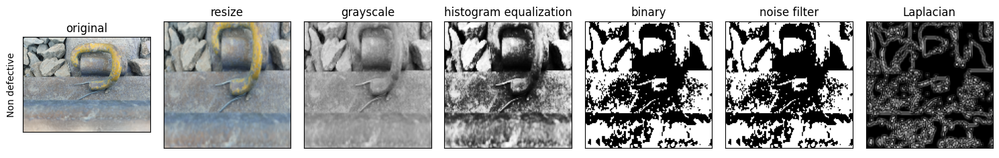

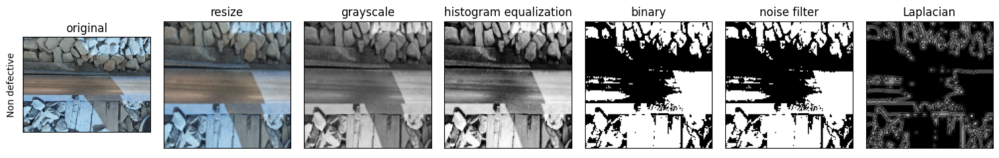

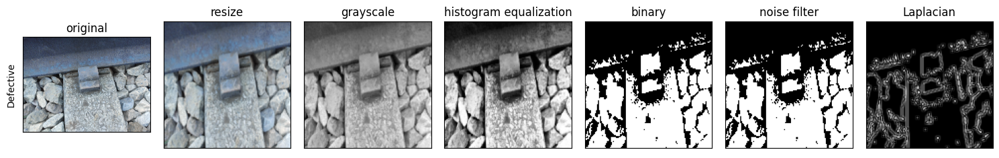

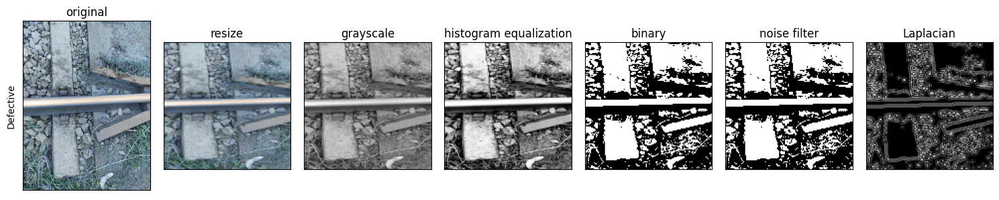

In [103]:
for sample in random_sample.itertuples():
    obj = ImageProcessor(sample)
    obj.resize()
    obj.grayscale()
    obj.hist_eq()
    obj.binary()
    obj.noise_filt(type='median', size=1)
    obj.Laplacian()
    obj.show()
    del obj    


Line detection

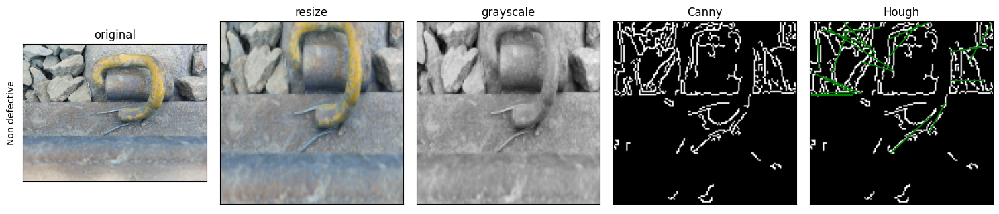

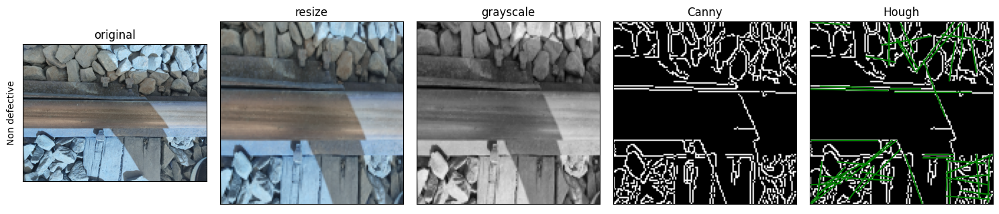

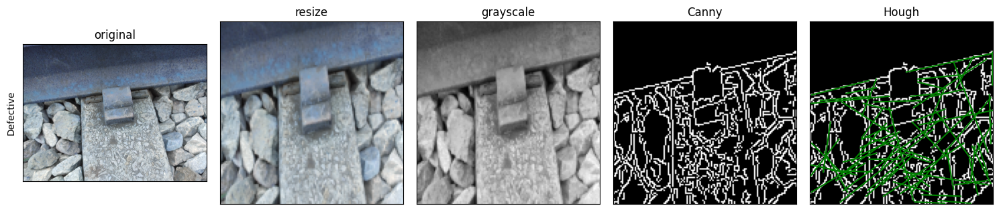

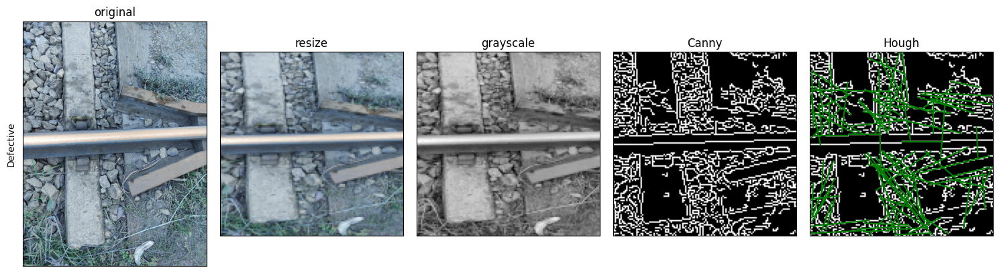

In [104]:
for sample in random_sample.itertuples():
    obj = ImageProcessor(sample)
    obj.resize()
    obj.grayscale()
    obj.Canny()
    obj.Hough()
    obj.show()
    del obj

Image processing pipeline

In [133]:
for sample in tqdm(images.itertuples()):
    path = sample.img.split('/')
    path[1] = preprocessed_folder
    dst = os.path.join(*path[1:])
    
    obj = ImageProcessor(sample)
    obj.resize()
    obj.grayscale()
    obj.hist_eq()
    obj.binary()
    obj.noise_filt(type='median', size=1)
    obj.Laplacian()
   
    cv.imwrite(dst, obj.imgs[-1])
    del obj



384it [01:42,  3.76it/s]


Loading preprocessed images for the neural network

In [148]:
batch_size = 32

train_data = tf.keras.utils.image_dataset_from_directory(
    os.path.join(preprocessed_folder, 'Train'),
    labels='inferred',
    image_size=(img_height, img_width), 
    color_mode='grayscale',
    batch_size=batch_size
)

validation_data = tf.keras.utils.image_dataset_from_directory(
    os.path.join(preprocessed_folder, 'Validation'),
    labels='inferred',
    image_size=(img_height, img_width), 
    color_mode='grayscale',
    batch_size=batch_size
)

class_names = train_data.class_names
print('Class names: ', class_names)

Found 300 files belonging to 2 classes.
Found 62 files belonging to 2 classes.
Class names:  ['Defective', 'Non defective']


Data augmentation

Performance settings

In [150]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_data.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_ds = validation_data.cache().prefetch(buffer_size=AUTOTUNE)

Constructing neural network

In [151]:
model = Sequential([
    layers.Rescaling(1./255, input_shape=(img_height, img_width, 1)),
    layers.Conv2D(16, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(32, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(64, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Flatten(),
    layers.Dense(units=int(img_height*img_width/2), activation='relu'),
    layers.Dense(units=int(img_height*img_width/4), activation='relu'),
    layers.Dense(len(class_names))
])

model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

model.summary()

2022-12-10 00:51:33.349838: W tensorflow/tsl/framework/cpu_allocator_impl.cc:82] Allocation of 536870912 exceeds 10% of free system memory.
2022-12-10 00:51:33.558250: W tensorflow/tsl/framework/cpu_allocator_impl.cc:82] Allocation of 536870912 exceeds 10% of free system memory.
2022-12-10 00:51:33.687763: W tensorflow/tsl/framework/cpu_allocator_impl.cc:82] Allocation of 536870912 exceeds 10% of free system memory.
2022-12-10 00:51:34.625930: W tensorflow/tsl/framework/cpu_allocator_impl.cc:82] Allocation of 134217728 exceeds 10% of free system memory.
2022-12-10 00:51:34.724061: W tensorflow/tsl/framework/cpu_allocator_impl.cc:82] Allocation of 134217728 exceeds 10% of free system memory.


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling (Rescaling)       (None, 128, 128, 1)       0         
                                                                 
 conv2d (Conv2D)             (None, 128, 128, 16)      160       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 64, 64, 16)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 64, 64, 32)        4640      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 32, 32, 32)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 32, 32, 64)        1

Train the model

In [152]:
epochs = 10
history = model.fit(
    train_data,
    validation_data=validation_data,
    epochs=epochs
)

Epoch 1/10
10/10 [==============================] - 48s 4s/step - loss: 7.5381 - accuracy: 0.5000 - val_loss: 0.7141 - val_accuracy: 0.5000
Epoch 2/10
10/10 [==============================] - 29s 3s/step - loss: 0.7226 - accuracy: 0.5000 - val_loss: 0.6946 - val_accuracy: 0.5000
Epoch 3/10
10/10 [==============================] - 34s 3s/step - loss: 0.6876 - accuracy: 0.5000 - val_loss: 0.6819 - val_accuracy: 0.5000
Epoch 4/10
10/10 [==============================] - 50s 5s/step - loss: 0.6550 - accuracy: 0.7467 - val_loss: 0.6335 - val_accuracy: 0.7419
Epoch 5/10
10/10 [==============================] - 53s 6s/step - loss: 0.5191 - accuracy: 0.7900 - val_loss: 0.5456 - val_accuracy: 0.7097
Epoch 6/10
10/10 [==============================] - 39s 4s/step - loss: 0.3073 - accuracy: 0.8800 - val_loss: 0.7043 - val_accuracy: 0.6452
Epoch 7/10
10/10 [==============================] - 49s 4s/step - loss: 0.1505 - accuracy: 0.9633 - val_loss: 0.8202 - val_accuracy: 0.6774
Epoch 8/10
10/10 [==

Metrics

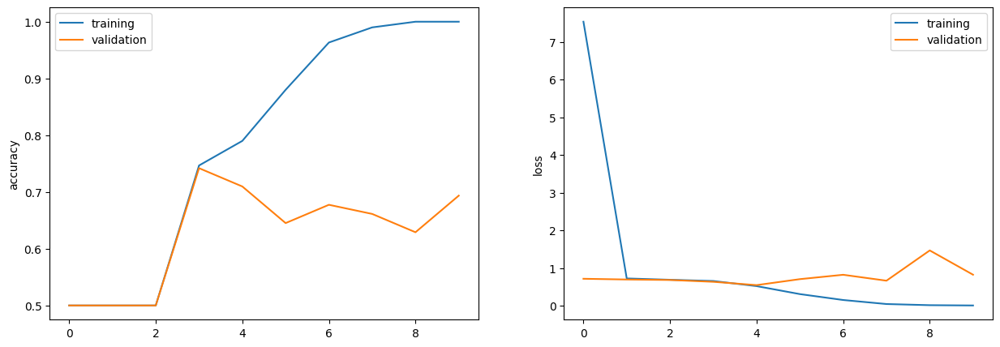

In [154]:
fig, ax = plt.subplots(1, 2, figsize=(15, 5))
sns.lineplot(x=np.arange(epochs), y='accuracy', data=history.history, ax=ax[0], label='training')
sns.lineplot(x=np.arange(epochs), y='val_accuracy', data=history.history, ax=ax[0], label='validation')
sns.lineplot(x=np.arange(epochs), y='loss', data=history.history, ax=ax[1], label='training')
sns.lineplot(x=np.arange(epochs), y='val_loss', data=history.history, ax=ax[1], label='validation')
plt.show()

Predictions

Found 22 files belonging to 2 classes.
1/1 [==============================] - 1s 638ms/step


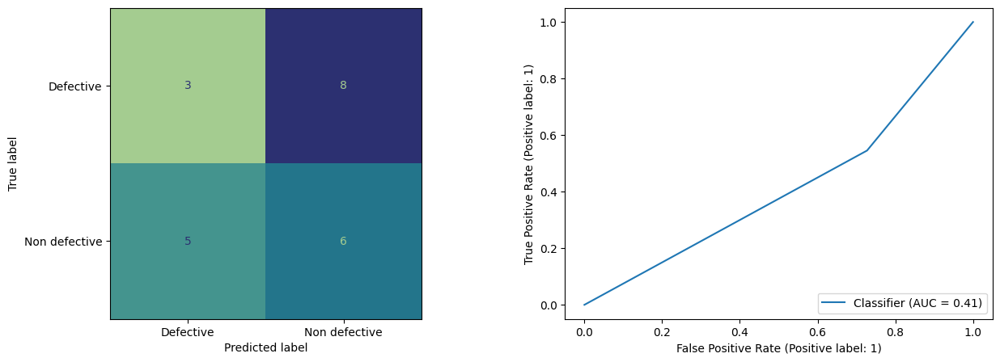

In [156]:
test_data = tf.keras.utils.image_dataset_from_directory(
    os.path.join(preprocessed_folder, 'Test'),
    labels='inferred',
    image_size=(img_height, img_width), 
    color_mode='grayscale',
    batch_size=batch_size
)

predictions = model.predict(test_data)
score = tf.nn.softmax(predictions)
y_pred = np.argmax(predictions, axis=1)
y_true = np.array(list(test_data.take(-1))[-1][-1])

fig, ax = plt.subplots(1, 2, figsize=(15, 5))
ConfusionMatrixDisplay.from_predictions(y_true, y_pred, display_labels=class_names, ax=ax[0], cmap='crest', colorbar=False)
RocCurveDisplay.from_predictions(y_true, y_pred, ax=ax[1])